<font size="+3">Module 42 - Deforestation Detection</font>

- Forests are vital to life on Earth. They purify the air we breathe, filter the water we drink, prevent erosion, and act as an important buffer against climate change. Forests offer a home to much of the world’s diverse array of plants and animals and provide essential natural resources from timber and food to medicinal plants. Forests also support the lives of local communities and help them to thrive.

- But forests around the world are under threat. Despite the key role forests play in the world's environmental and economic health, we continue to lose forests, along with the endangered animals that live in them. In 2020, the tropics lost more than 12 million hectares of tree cover. That's roughly 30 soccer fields’ worth of trees every single minute. Illegal logging, poor forest management practices, and growing demand for forest and agricultural products contribute to their rampant destruction. Deforestation is especially severe in some of the world’s most biologically diverse regions, such as the Amazon, Borneo and Sumatra, the Congo Basin, and the Russian Far East. As a result, nearly half the world’s original forests have been lost.

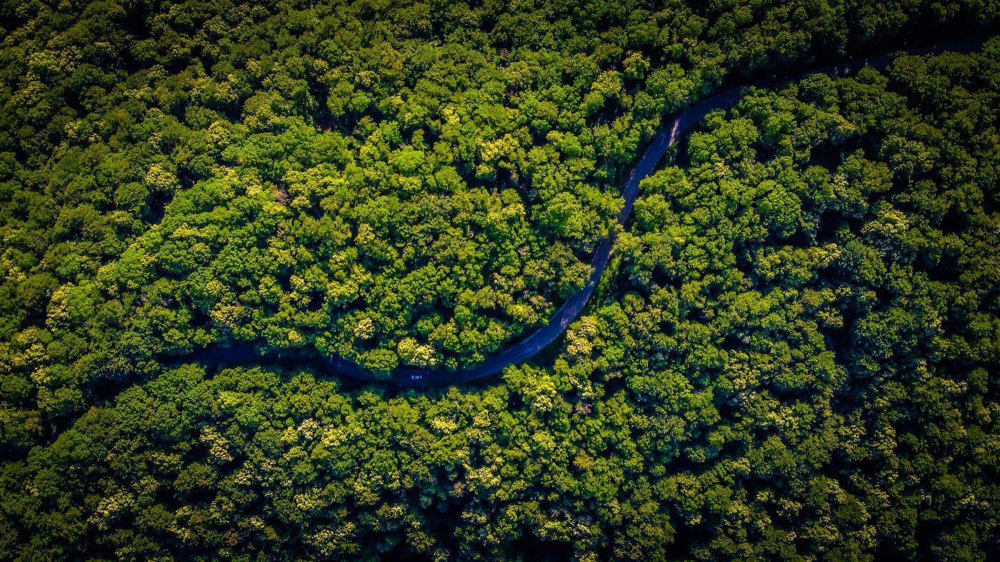

**Let us begin the notebook by recalling the AI Project Cycle. In this notebook we will be following the AI project cycle to build the use case of deforestation detection using AI.**

## -  AI Project Cycle 

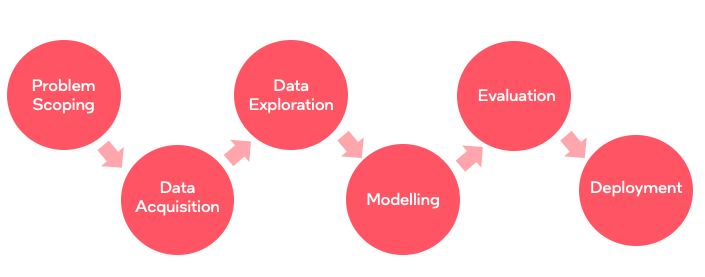

## Problem Scoping (AI Project Cycle - Step 1)

Deforestation is the purposeful clearing of forested land. Throughout history and into modern times, forests have been razed to make space for agriculture and animal grazing, and to obtain wood for fuel, manufacturing, and construction. Deforestation has greatly altered landscapes around the world


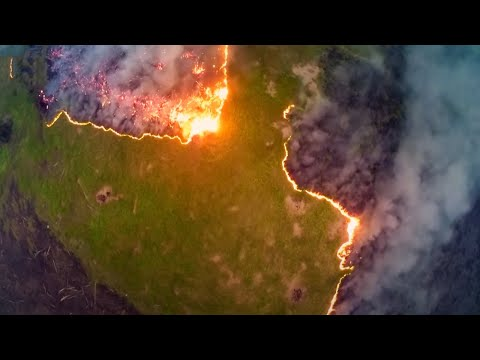

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('B5Fwl4P4EW8')

### Import Libraries

In [12]:
import numpy as np
import pandas as pd
!pip install selenium -q
from PIL import Image
import os
import matplotlib
import matplotlib.pyplot as plt
from random import shuffle
import tensorflow as tf
from os import listdir
from os.path import isfile, join





import warnings 
warnings.filterwarnings('ignore')



from bokeh.io import output_file, show
from bokeh.models import ColumnDataSource
from bokeh.palettes import Spectral6
from bokeh.plotting import figure
from bokeh.io import push_notebook, show, output_notebook
from bokeh.resources import INLINE
from bokeh.io import export_png


import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation,\
                                    MaxPool2D, UpSampling2D, concatenate,\
                                    Input, Conv2DTranspose, MaxPooling2D,\
                                    Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator


from tensorflow.keras import backend as K
from scipy.ndimage import distance_transform_edt as distance

## - Dataset:  Data Acquisition (AI Project Cycle - Step 2)



### Building helper functions to create directories and retrieve data from the folders

In [14]:
def list_dataset_new(path):
  """
  path - Location of the mask and images folder
  """
  prefix_mask = "/masks"
  prefix_image = "/images"

  images = [f"{f}" for f in listdir(path + prefix_image) if f.endswith(".png")]
  masks = images.copy()
  # images = [f"{f}" for f in listdir(path + prefix_dev_image) if f.endswith(".png")]
  print(f"[INFO] Found train images: {len(listdir(path + prefix_image))}")
  print(f"[INFO] Found train masks: {len(listdir(path + prefix_mask))}")

  pairs_train = [(f"{path}{prefix_image}/{f}", f"{path}{prefix_mask}/{f}") for f in images]
  # pairs_dev = [(f"{path}{prefix_dev_image}/{f}", f"{path}{prefix_dev_mask}/{f}") for f in images_dev]

  return pairs_train

l = list_dataset_new("Dataset/Training_Data")

[INFO] Found train images: 322
[INFO] Found train masks: 322


In [15]:

def preprocess_one_hot_encode(image_rgb):
    img = np.copy(image_rgb[..., 0])
    for i, num in enumerate([11, 226, 51]):
        img[img == num] = i
    one_hot = tf.keras.utils.to_categorical(img, 3)
    return one_hot

- It can be observed that, there are two folder with 322 images each.
- We will be discuss the two types of folder in detail later

In [16]:
# Building helper fucntions to customise the images in the tensorflow format, so that we can use the tensorflow library to preprocess the data later

def printDivisors(n) :
    i = 1
    ls = []
    while i <= n :
        if (n % i==0) :
            ls.append(i),
        i = i + 1
    return ls

# Helper functions for defining tf types
def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _int64_feature(value):
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

def _float_feature(value):
  """Returns a float_list from a float / double."""
  return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def write_image_annotation_pairs_to_tfrecord(filename_pairs, tfrecords_filename): 
    writer = tf.io.TFRecordWriter(tfrecords_filename)

    for img_path, mask_path in filename_pairs:

        img = open(img_path, 'rb').read()
        annotation = open(mask_path, 'rb').read()
        mask = np.asarray(Image.open(mask_path))
        mask_one_channel = np.copy(mask[..., 0])
        for i, num in enumerate([11, 226, 51]):
          mask_one_channel[mask_one_channel == num] = i
        mask_one_hot = tf.keras.utils.to_categorical(mask_one_channel, 3).ravel().tobytes()

        example = tf.train.Example(features=tf.train.Features(feature={
              'image': _bytes_feature(img),
              'mask': _bytes_feature(mask_one_hot),
              }))

        writer.write(example.SerializeToString())
    writer.close()

In [ ]:
from PIL import Image
import os

## saving the customised images/tfrecords in a seperate folder

filename_pairs = list_dataset_new("Dataset/Training_Data")
# 0 - element is train dataset, 1 - element is dev dataset
shuffle(filename_pairs)
possible_amounts = printDivisors(len(filename_pairs))
print(f'[INFO] Good dataset sizes: ')
for i in possible_amounts:
  print(f"- {i}")

try:
    os.makedirs("tfrecords")
except:
    pass

tfrecords_filename_template = r"tfrecords\tfrecords_v2_part_{}.tfrec"

for i in range(400):
  filename = tfrecords_filename_template.format(i)
  if os.path.exists(filename):
    os.remove(filename)
    print(f"Removed {filename}")
# if  os.path.exists(tfrecords_filename_dev):
#     os.remove(tfrecords_filename_dev)
#     print("Removed dev.tfrec")

print("[INFO] Writing started!")

photos_in_tfrecord = 23
counter = 0

for i in range(len(filename_pairs)):
  filename = tfrecords_filename_template.format(i+1)
  files = filename_pairs[i * photos_in_tfrecord : i * photos_in_tfrecord + photos_in_tfrecord]
  
  if i * photos_in_tfrecord > len(filename_pairs):
    break
  if len(filename_pairs[(i+1) * photos_in_tfrecord : (i+1) * photos_in_tfrecord + photos_in_tfrecord]) < photos_in_tfrecord:
    files = filename_pairs[i * photos_in_tfrecord : (i+1) * photos_in_tfrecord + photos_in_tfrecord]
    write_image_annotation_pairs_to_tfrecord(files, filename)  
    print(f'[INFO] File : {filename} written, with {photos_in_tfrecord} pairs of the photos.')
    counter += 1
    break

  write_image_annotation_pairs_to_tfrecord(files, filename)  
  print(f'[INFO] File : {filename} written, with {photos_in_tfrecord} pairs of the photos.')
  counter += 1

print(f"[INFO] Files created : {counter}.")

### Load/Read Data

In [23]:
# Function to load the data

def load_raw_images(y_path):
    Y = []
    for filename in os.listdir(y_path):
        if filename.endswith("png"):
            Y.append(filename)
    return Y

def load_test_images(path):
    images = load_raw_images(path)
    np_images = []
    for image in images:
        im_x = Image.open(f"{path}/{image}")
        im_x_np = np.asarray(im_x, dtype="float32") / 255.0
        np_images.append(im_x_np)
    return np_images



In [24]:
#Loading the data - Actual Images and Labeled Mask

Y = load_test_images("Dataset/Training_Data/masks")
X = load_test_images("Dataset/Training_Data/images")

In [25]:
# Converting all the images to arrays - as computers cannot view images, but only understand numbers

Y_np = np.array(Y)
X_np = np.array(X)


#Viewing the shape/dimensions of the array- recall the matrices from Module 26

Y_np.shape

(322, 512, 512, 3)

- It can be observed that, its a 4 dimensional matrix
  - Dimension 1 (322) - This represents the total number of images are present in the dataset
  - Dimension 2 (512) - It represents the length of image(i.e No. of pixels along the rows)
  - Dimension 3 (512) - It represents the breadth of image(i.e No. of pixels along the columns)
  - Dimension 4 (3)   - It represents the number of channels/colors present in each image(Red, Green,Blue)

## - Data Preprocessing ------ Data Exploration(AI Project Cycle - Step 3)

### Building helper functions for Data Exploration


In [26]:
## Building functions for getting the converting the images to numrical arrays
##Recall the Matrices sections of Module 26. 

def count_pixels(image):
    red, green, blue = (226, 19, 15), (11, 195, 72), (51, 15, 200)
    colors = {"red": 0, "green": 0, "blue": 0}
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            pixel = image[i][j]
            pixel = np.round(pixel*255).astype('int32')
            if (pixel == red).all():
                colors["red"] += 1
            elif (pixel == blue).all():
                colors["blue"] += 1
            elif (pixel == green).all():
                colors["green"] += 1
    return colors

def get_pixel_data(Y):
    quantity = Y.shape[0]
    print(f"[INFO] Get pixels from {quantity} images.")
    colors_global = {"red": 0, "green": 0, "blue": 0}
    df = pd.DataFrame(data=np.zeros((quantity, 3)), columns=['red', 'green', 'blue'])
    for i, image in enumerate(Y):
        print(f"[INFO] Image {i+1}/{quantity}")
        colors = count_pixels(image) 
        for color, value in colors.items():
            colors_global[color] += value
            df.loc[i][color] = value
    print("[INFO] Count complete.")
    return colors_global, df

def get_dataset_metadata(X, Y):
    size = X.shape[0]
    height, width = X.shape[1:3]
    channels = X.shape[3]
    parameters = {"size": size,
                  "height": height,
                  "width": width,
                  "channels": channels}
    for parameter, value in parameters.items():
        print(f"[INFO] {parameter} => {value}")
        
def display(X, Y, name):
    fig, ax = plt.subplots(ncols=2,
                           nrows=X.shape[0],
                           figsize=(X.shape[0]*5, X.shape[0]*8),
                           sharex=True, sharey=True)
    x_ax = []
    df_ax = pd.DataFrame.from_records(ax)
    # Plot initial images
    for i, im in enumerate(X):
        df_ax.iloc[i][0].imshow(im)
        df_ax.iloc[i][0].set_xticklabels([])
        df_ax.iloc[i][0].set_yticklabels([])
        if i == 0:
            df_ax.iloc[i][0].set_title(f'Satellite Images 512x512 pixels', fontsize=20)
    for i, im in enumerate(Y):
        df_ax.iloc[i][1].imshow(im)
        df_ax.iloc[i][1].set_xticklabels([])
        df_ax.iloc[i][1].set_yticklabels([])
        if i == 0:
            df_ax.iloc[i][1].set_title(f'RGB Segmentation Mask', fontsize=20)

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig(name)
    plt.show()

### Converting the image pixel into numerical dataframe to ensure computer readability

In [ ]:
# This line of code converts the pixel and pixel color information inform of a dataframe, so that it the images become computer readable
# This cell might take more than 20 mins to run, hence we have already stored the ouput of this cell and loaded it in the next cell for visualisation 
colors, df = get_pixel_data(Y_np[:])

In [28]:
df = pd.read_csv("Dataset/dataframe_322.csv")
df = df.loc[:][['red', 'green', 'blue']]
df

,red,green,blue
0,0.0,261850.0,294.0
1,26184.0,234295.0,1665.0
2,39230.0,222914.0,0.0
3,43244.0,214675.0,4225.0
4,0.0,3230.0,258914.0
...,...,...,...
317,32002.0,225903.0,4239.0
318,0.0,260506.0,1638.0
319,0.0,0.0,262144.0
320,0.0,260699.0,1445.0


In [29]:
colors          = {'red': 3878379, 'green': 32288939, 'blue': 1581227}
colors_balanced = {'red': 5412925, 'green': 34175495, 'blue': 3140800}
get_dataset_metadata(X_np, Y_np), colors_balanced

[INFO] size => 322
[INFO] height => 512
[INFO] width => 512
[INFO] channels => 3


(None, {'red': 5412925, 'green': 34175495, 'blue': 3140800})

### View Data

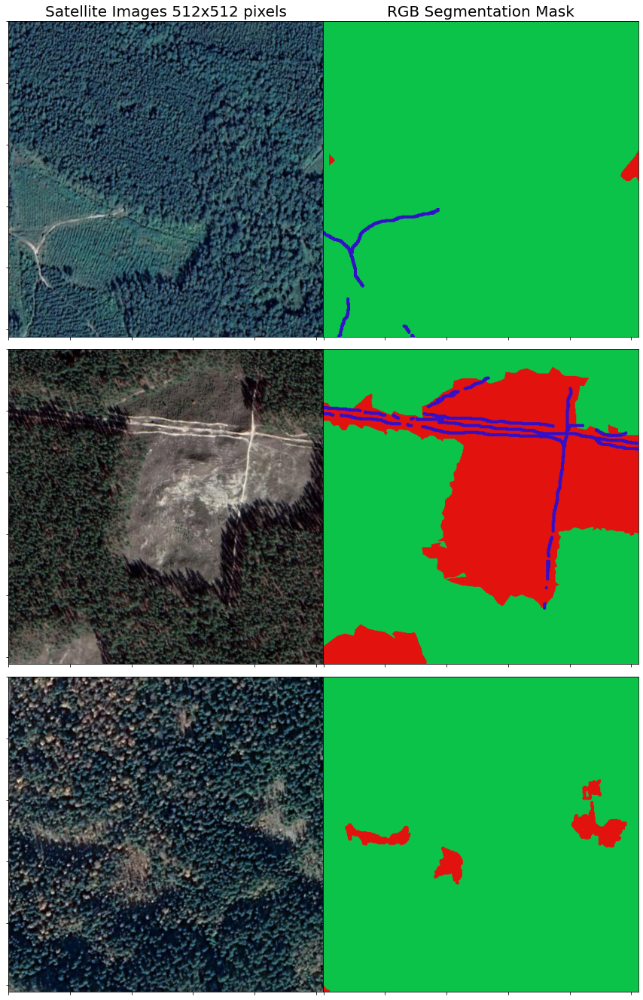

In [30]:
#Visualing the loaded data 

start = 58
display(X_np[start:start+3], Y_np[start:start+3], name="Images_and_masks.png")

- It can be observed that, there are two file named as:

1.Images
2.Mask
  
  - The images and mask exists in pairs, where the images folder contain the actual GIS images of the forest
  - The mask folder contains the RGB annotated images of the corresponding GIS images
  - Hence we can say,that we have labeled data, therefore, we can say that this is a supervised learning problem.
  
 

### Attribute Information of the masks 


- The area in <font color='green'>green color</font> - represents forest 
- The area in <font color='red'>red</font> - represents possible deforestation area 
- The area in <font color='blue'>blue</font> - represents other areas (buiding, roads, rivers etc)


### Visualizing the class distribution <font color='green'>(Classes- Forest,Deforestation,Others)
</font> 

In [31]:
#Visualising the Class distribution among the dataset


output_notebook(resources=INLINE)

#output_file("colormapped_bars.html")

fruits = ['Forest', 'Deforestation', 'Other']
counts = [colors['green'], colors['red'], colors['blue']]

source = ColumnDataSource(data=dict(fruits=fruits, counts=counts, color=['green', 'red', 'blue']))
# y_range = [10 ** 0, 10 ** 3]
# y_range=(0, colors['green']+100000)
p = figure(x_range=fruits, y_range = [10 ** 0, 10 ** 9], plot_height=550, plot_width=850, title="Classes Distribution (log scale)",
           toolbar_location=None, tools="", y_axis_type="log")

p.vbar(x='fruits', top='counts', width=0.8, color='color',  source=source, bottom=0.1)

p.xgrid.grid_line_color = None
p.title.text_font_size = '20pt'
p.legend.label_text_font_size  = '16pt'
p.legend.orientation = "horizontal"
p.legend.location = "top_center"
# export_png(p, filename="/content/gdrive/MyDrive/Dataset/dataset_08_04_2021/Data_distribution_log.png")
show(p)

Loading BokehJS ...

Observations:

- We observe that the Forest class(i.e the images with green color) have the maximum area covered in most of the images
- Whereas, deforestation and Others class share the 2nd and 3rd place repectively in area distribution among the images 
- Although the Deforestation and Others class are less, in the dataset, they aren't significantly less, therefore we don't have to worry about class imbalance and oversampling. 

### Visualizing the actual images merged with masks   

In [32]:
# Building a fucntion to merge the images with the masks, this will help us visualise the the overlap between the classes
def display_with_masks(X, Y, name, alpha=0.45):
    fig, ax = plt.subplots(ncols=X.shape[0]//2,
                           nrows=2,
                           figsize=(X.shape[0]*5, X.shape[0]*5),
                           sharex=True, sharey=True)
    x_ax = []
    df_ax = pd.DataFrame.from_records(ax)
    # Plot initial images
    counter = 0
    for j in range(2):
        for i in range(X.shape[0]//2):
            if i+j == 0:
                df_ax.iloc[i][j].set_title(f"Images merged with masks (alpha={alpha})", fontsize=20)
            im = X[counter] + Y[counter] * alpha
            df_ax.iloc[j][i].imshow(im)
            df_ax.iloc[j][i].set_xticklabels([])
            df_ax.iloc[j][i].set_yticklabels([])
            counter += 1
            
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig(name)
    plt.show()

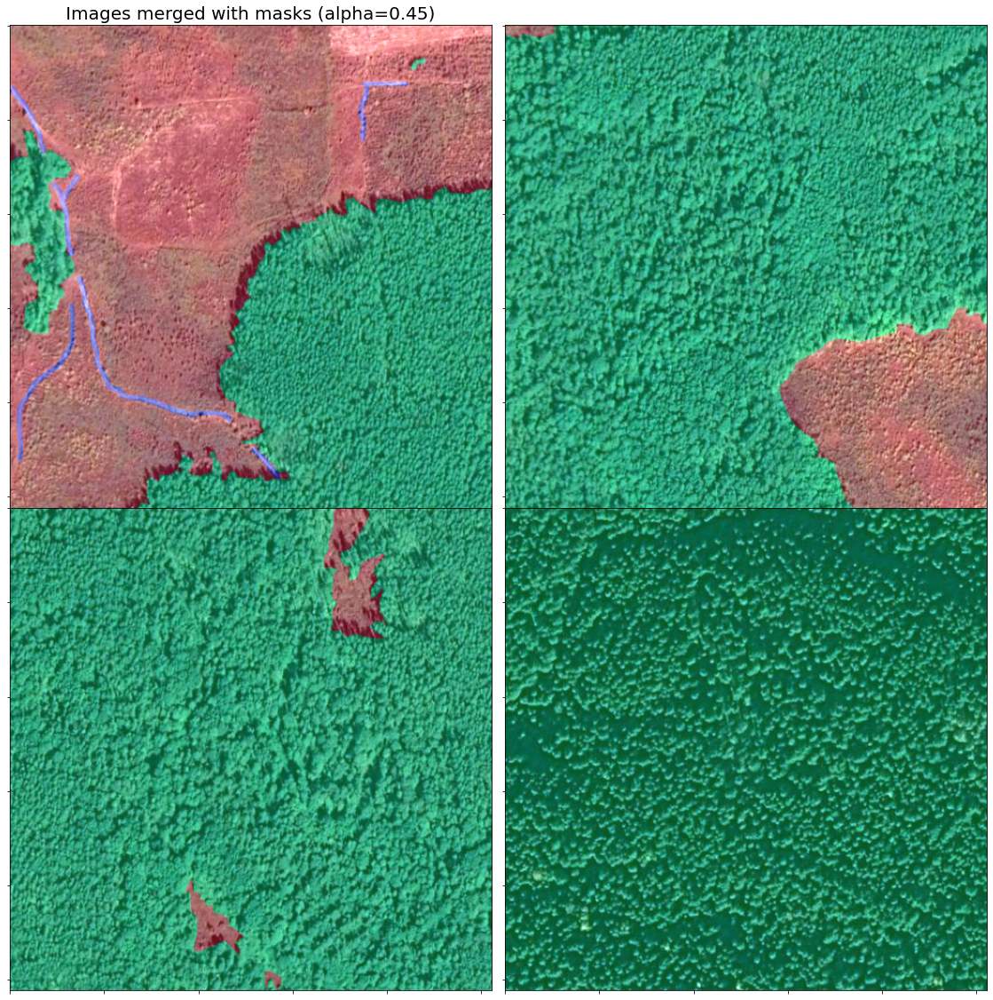

In [33]:
display_with_masks(X_np[:4], Y_np[:4], name="Images_merged_masks.png")

Observations:

- We can see that, the the merged images helps us to easily visualize the actual classes with the masked classes.
- For example, for the image in the first row and second column, we can clearly observe that the roads in the image are marked blue and the deforested area of the image are marked red. Hence we can conclude the masking/annotation done to the images are very accurate. Therefore, we can trust the accuracy of the classes and continue with building the AI model.

### Visualization- <font color='green'>Box-Plot
</font> 

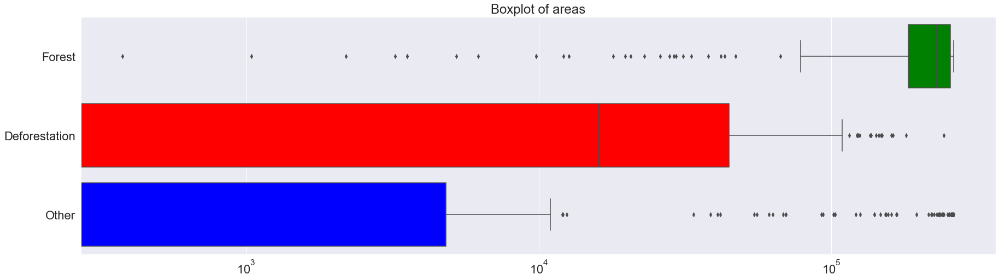

In [34]:
## Ploting a box plot, to understand the variance of the different classes
## Plotting a box plot will alos help us understand the outliers present in the dataset for each classes

import seaborn as sns

sns.set(font_scale=2)
plt.figure(figsize=(30, 8))
plt.title("Boxplot of areas")
sns.set_theme(style="whitegrid")
df.columns = ["Deforestation", "Forest", "Other"]
box = sns.boxplot(data=df, orient='h', order=["Forest", "Deforestation", "Other"])

forest_box = box.artists[0]
forest_box.set_facecolor('green')
forest_box.set_label("Forest")
deforest_box = box.artists[1]
deforest_box.set_facecolor('red')
other_box = box.artists[2]
other_box.set_facecolor('blue')

box.set_xscale("log")
#plt.savefig("/Users/sarangsonar/Desktop/Deforestation Monitoring /dataset_08_04_2021/Whiskers_area_distribution_1.png")
plt.show()

### Visualization-  <font color='green'>Percentage of class distribution per image
</font> 

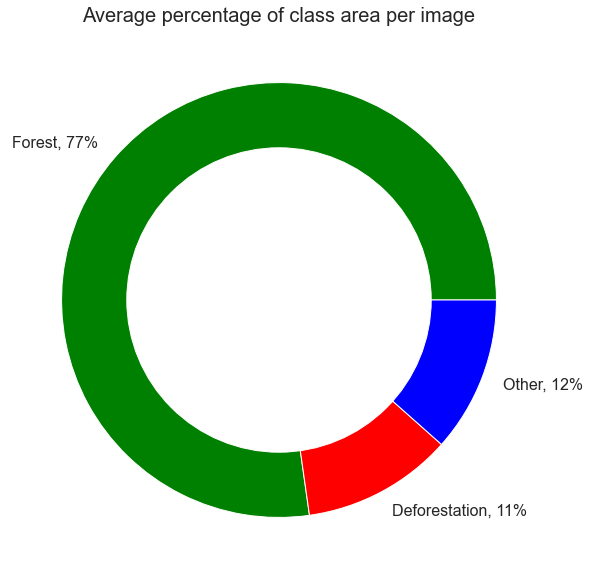

In [35]:
size=[df["Forest"].sum()//df.shape[0], df["Deforestation"].sum()//df.shape[0], df["Other"].sum()//df.shape[0]]
my_sum = sum(size)
percents = [str(round((i/my_sum)*100))+"%" for i in size]
names=[f"Forest, {percents[0]}", f"Deforestation, {percents[1]}", f"Other, {percents[2]}"]

plt.figure(figsize=(12, 10))
# Create a circle for the center of the plot
my_circle=plt.Circle((0,0), 0.7, color='white')
 
# Custom colors --> colors will cycle
plt.title("Average percentage of class area per image", fontsize = 20)
plt.pie(size, labels=names, colors=['green','red','blue'], textprops={'fontsize': 16})
p=plt.gcf()
p.gca().add_artist(my_circle)
#plt.savefig("Average_percentage_of_class_area_per_image.png")
plt.show()

Observations:

- We can observe that, 77% of the average area in a given image is covered in green,i.e it is labeled/masked with forest class
- Whereas, on a average only 11% and 12% of the area in an image is labeled or masked with the class of Deforestation and Other respectively.

## - Modeling ------ Modeling(AI Project Cycle - Step 4)

In [36]:
## Check the tensorflow version installated in your system
## Please make sure tensorflow version 2.0 is installed in your system, else you might experience errors while executing code in this section 

print("TensorFlow version " + tf.__version__)
AUTO = tf.data.experimental.AUTOTUNE

TensorFlow version 2.5.3


### Building Custom Convolutional Neural Network


In [37]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True, sublayers=2):
    '''In case batchnorm=False "if" statement will be skipped and in amount of "sublayers" convolutional layers will be created.'''
    for idx in range(sublayers):
        conv = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size),
                   kernel_initializer="he_normal", padding="same")(input_tensor if idx==0 else conv)
        if batchnorm:
            normalized = BatchNormalization()(conv)
        conv = Activation("relu")(conv) # normalized to conv
    return conv

def conv2d_transpose_block(input_tensor, concatenate_tensor, n_filters, kernel_size=3, strides=2, transpose=False):
    if transpose:
        conv = Conv2DTranspose(n_filters, (kernel_size, kernel_size),
                               strides=(strides, strides), padding='same')(input_tensor)
    else:
        conv = Conv2D(n_filters, (kernel_size, kernel_size), activation = 'relu', padding = 'same',
                      kernel_initializer = 'he_normal')(UpSampling2D(size=(kernel_size, kernel_size))(input_tensor))
    conv = Activation("relu")(conv)
    concatenation = concatenate([conv, concatenate_tensor])
    return concatenation

def build_unet(input_shape=(512, 512, 3), filters=[16, 32, 64, 128, 256], batchnorm=True, transpose=False, dropout_flag=False):  # dropout_rate=0.2
    
    conv_dict = dict()
    inputs = Input(input_shape)
    dropout_rate = 0.5
    
    for idx, n_filters in enumerate(filters[:-1]):
        conv = conv2d_block(inputs if n_filters==filters[0] else max_pool, # Change max_pool to dropout
                            n_filters=n_filters, kernel_size=3,
                            batchnorm=batchnorm)
        max_pool = MaxPooling2D((2, 2))(conv)
        # Commented dropout
#         if idx > 1 and dropout_flag:
#             print('[INFO] Dropout down')
#             dropout = Dropout(dropout_rate)(max_pool)
#         else:
#             print('[INFO] Dropout down skip')
#             dropout = max_pool
#         print(f'[INFO] Conv block {idx} created.')
        # Save layer
        conv_dict[f"conv2d_{idx+1}"] = conv
        
    # Change max_pool to dropout
    conv_middle = conv2d_block(max_pool, n_filters=filters[-1], kernel_size=3, batchnorm=batchnorm)
        
    for idx, n_filters in enumerate(reversed(filters[:-1])):
        concatenation = conv2d_transpose_block(conv_middle if idx==0 else conv,
                                               conv_dict[f"conv2d_{len(conv_dict) - idx}"],
                                               n_filters, kernel_size=2, strides=2, transpose=transpose) # kernel_size=2, like in previous
        # Commented Dropout
#         if idx < len(filters) - 3 and dropout_flag:
#             print('[INFO] Dropout up')
#             dropout = Dropout(dropout_rate)(concatenation)
#         else:
#             print('[INFO] Dropout up skip')
#             dropout = concatenation
        conv = conv2d_block(concatenation, n_filters=n_filters, kernel_size=3, # Change concatenation to Dropout
#                             batchnorm = batchnorm if idx not in [len(conv_dict), len(conv_dict) - 1] else False)
                              batchnorm = batchnorm)
        print(f'[INFO] UpConv block {idx} created.')
    outputs = Conv2D(3, (1, 1), activation='softmax')(conv)
    model = Model(inputs=inputs, outputs=outputs)
    return model

In [39]:
final_filters = 2048
path_to_load = "Pretrained_Weights.h5"


model_1 = build_unet(input_shape=(512, 512, 3),
                    filters=[2 ** i for i in range(5, int(np.log2(final_filters) + 1))], # Amount of filters in U-Net arch.
                     batchnorm=False, transpose=False, dropout_flag=False)
model_1.load_weights(path_to_load)



model_2 = build_unet(input_shape=(1024, 1024, 3),
                     filters=[2 ** i for i in range(5, int(np.log2(final_filters) + 1))], # Amount of filters in U-Net arch.
                     batchnorm=False, transpose=False, dropout_flag=False)
model_2.load_weights(path_to_load)



[INFO] UpConv block 0 created.
[INFO] UpConv block 1 created.
[INFO] UpConv block 2 created.
[INFO] UpConv block 3 created.
[INFO] UpConv block 4 created.
[INFO] UpConv block 5 created.
[INFO] UpConv block 0 created.
[INFO] UpConv block 1 created.
[INFO] UpConv block 2 created.
[INFO] UpConv block 3 created.
[INFO] UpConv block 4 created.
[INFO] UpConv block 5 created.


In [40]:
model_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_33 (Conv2D)              (None, 512, 512, 32) 896         input_2[0][0]                    
__________________________________________________________________________________________________
activation_32 (Activation)      (None, 512, 512, 32) 0           conv2d_33[0][0]                  
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 512, 512, 32) 9248        activation_32[0][0]              
____________________________________________________________________________________________

## Evaluation - (AI Project Cycle Step-5)

- We now have to test our Deep Learning model by using different images of Geospatial Forest Images

### Loading test images

In [42]:
# Loading 5 test images 

image1 = Image.open('Dataset/Training_Data/images/198_prev_dev.png')
image2 = Image.open('Dataset/Training_Data/images/168_IvanoFrank_2.png')
image3 = Image.open('Dataset/Training_Data/images/205_prev_dev.png')
image4 = Image.open('Dataset/Training_Data/images/169_Balak.png')
image5 = Image.open('Dataset/Training_Data/images/168_IvanoFrank_2.png')


### Preprocessing Images  

In [43]:
# Preprocssing the images to NumPy arrays

i1 = np.array(image1)
i2 = np.array(image2)
i3 = np.array(image3)
i4 = np.array(image4)

i12 = np.concatenate((i1, i2), axis=1)
i34 = np.concatenate((i3, i4), axis=1)
image_1024 = np.concatenate((i12, i34), axis=0)
image_1024 = image_1024[np.newaxis, ...]
image_1024.shape

(1, 1024, 1024, 3)

### Predicting masked images

<Figure size 432x288 with 0 Axes>

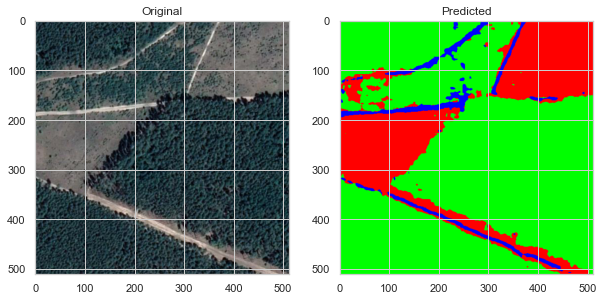

In [44]:
image_orig = image1
image = i1[np.newaxis, ...]
prediction = model_1.predict(image)# Using the Model_1 built earlier
prediction_class1 = np.copy(prediction[..., 0]) # Forest
prediction_class2 = np.copy(prediction[..., 1]) # Deforest
prediction[..., 0] = prediction_class2 # RED - Deforest
prediction[..., 1] = prediction_class1 # GREEN - Forest
plt.figure() 
plt.rcParams["figure.figsize"] = (10,10)
#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(1,2) 
axarr[0].imshow(image_orig)
axarr[0].set_title('Original')
axarr[1].imshow(prediction[0])
axarr[1].set_title('Predicted')
plt.show()

<Figure size 720x720 with 0 Axes>

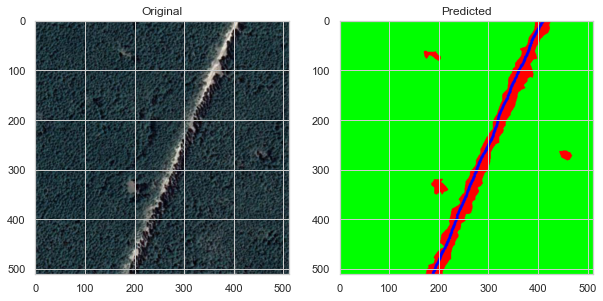

In [45]:
image_orig = image3
image = i3[np.newaxis, ...]
prediction = model_1.predict(image)# Using the Model_1 built earlier
prediction_class1 = np.copy(prediction[..., 0]) # Forest
prediction_class2 = np.copy(prediction[..., 1]) # Deforest
prediction[..., 0] = prediction_class2 # RED - Deforest
prediction[..., 1] = prediction_class1 # GREEN - Forest
plt.figure() 
plt.rcParams["figure.figsize"] = (10,10)
#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(1,2) 
axarr[0].imshow(image_orig)
axarr[0].set_title('Original')
axarr[1].imshow(prediction[0])
axarr[1].set_title('Predicted')
plt.show()

### Building a Prediction function

In [46]:
## We build a prediction fucntion using the model built earlier
# This function takes in input images and returns masked image as ouput with the three classes mentioned earlier

def masked_predictions(query_image_path):
    image1 = Image.open(query_image_path)
    i1 = np.array(image1)
    image_orig = image1
    image = i1[np.newaxis, ...]
    prediction = model_1.predict(image)# Using the Model_1 built earlier
    prediction_class1 = np.copy(prediction[..., 0]) # Forest
    prediction_class2 = np.copy(prediction[..., 1]) # Deforest
    prediction[..., 0] = prediction_class2 # RED - Deforest
    prediction[..., 1] = prediction_class1 # GREEN - Forest
    plt.figure() 
    plt.rcParams["figure.figsize"] = (10,10)
    #subplot(r,c) provide the no. of rows and columns
    f, axarr = plt.subplots(1,2) 
    axarr[0].imshow(image_orig)
    axarr[0].set_title('Original')
    axarr[1].imshow(prediction[0])
    axarr[1].set_title('Predicted')
    
    return plt
    

### Making Predictions using the prediction function

<module 'matplotlib.pyplot' from 'd:\\my internships\\sustainable living labs\\openvino_env\\lib\\site-packages\\matplotlib\\pyplot.py'>

<Figure size 720x720 with 0 Axes>

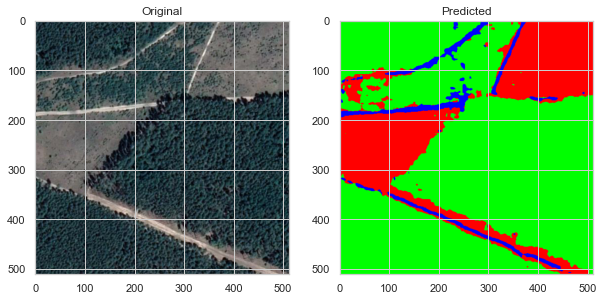

In [47]:
masked_predictions("Dataset/Training_Data/images/198_prev_dev.png")



<module 'matplotlib.pyplot' from 'd:\\my internships\\sustainable living labs\\openvino_env\\lib\\site-packages\\matplotlib\\pyplot.py'>

<Figure size 720x720 with 0 Axes>

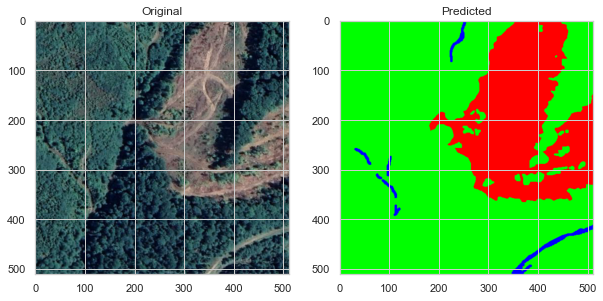

In [48]:
masked_predictions("Dataset/Training_Data/images/168_IvanoFrank_2.png")
